In [3]:
import keras
from keras import layers
from keras import ops
from keras.utils import load_img
from keras.utils import array_to_img
from keras.utils import img_to_array
from keras.preprocessing import image_dataset_from_directory
import tensorflow as tf  #  only for data preprocessing

import os
import math
import numpy as np

from IPython.display import display

In [9]:
root_dir = "./BSDS500/data"

In [10]:
crop_size = 300
upscale_factor = 3
input_size = crop_size // upscale_factor
batch_size = 8

train_ds = image_dataset_from_directory(
    root_dir,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="training",
    seed=1337,
    label_mode=None,
)

valid_ds = image_dataset_from_directory(
    root_dir,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="validation",
    seed=1337,
    label_mode=None,
)

Found 500 files.
Using 400 files for training.
Found 500 files.
Using 100 files for validation.


In [11]:
def scaling(input_image):
    input_image = input_image / 255.0
    return input_image


# Scale from (0, 255) to (0, 1)
train_ds = train_ds.map(scaling)
valid_ds = valid_ds.map(scaling)

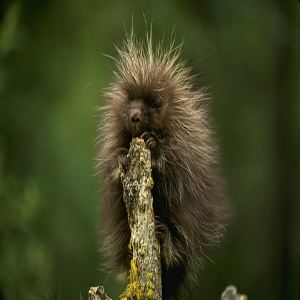

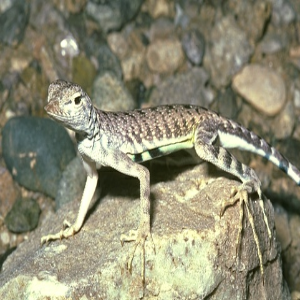

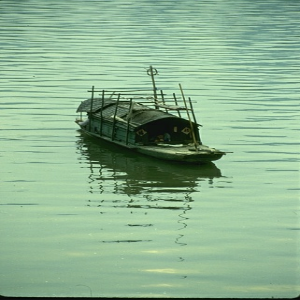

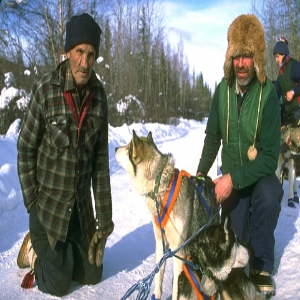

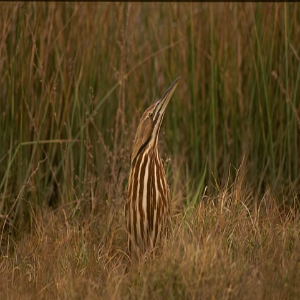

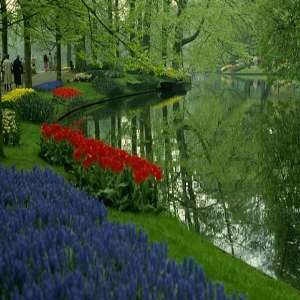

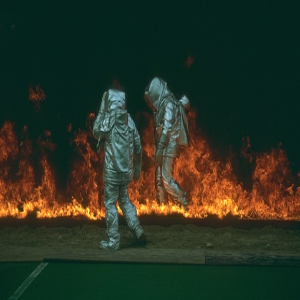

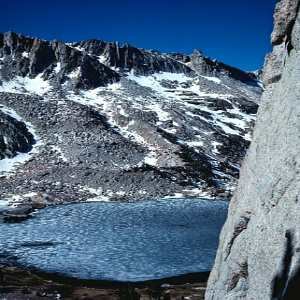

2025-10-26 14:10:50.637387: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [12]:
for batch in train_ds.take(1):
    for img in batch:
        display(array_to_img(img))

In [13]:
dataset = os.path.join(root_dir, "images")
test_path = os.path.join(dataset, "test")

test_img_paths = sorted(
    [
        os.path.join(test_path, fname)
        for fname in os.listdir(test_path)
        if fname.endswith(".jpg")
    ]
)

In [14]:
# Use TF Ops to process.
def process_input(input, input_size, upscale_factor):
    input = tf.image.rgb_to_yuv(input)
    last_dimension_axis = len(input.shape) - 1
    y, u, v = tf.split(input, 3, axis=last_dimension_axis)
    return tf.image.resize(y, [input_size, input_size], method="area")


def process_target(input):
    input = tf.image.rgb_to_yuv(input)
    last_dimension_axis = len(input.shape) - 1
    y, u, v = tf.split(input, 3, axis=last_dimension_axis)
    return y


train_ds = train_ds.map(
    lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)
train_ds = train_ds.prefetch(buffer_size=32)

valid_ds = valid_ds.map(
    lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)
valid_ds = valid_ds.prefetch(buffer_size=32)

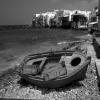

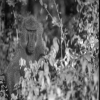

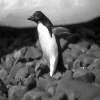

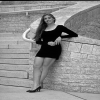

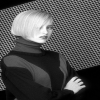

...

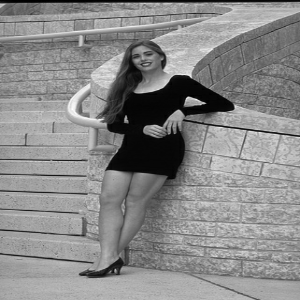

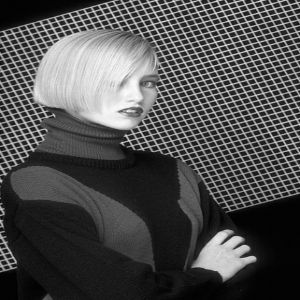

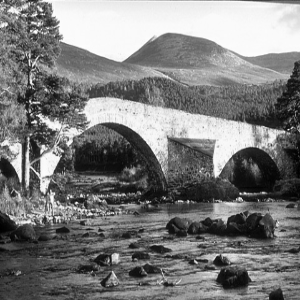

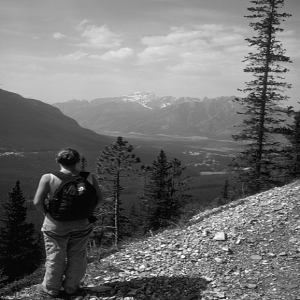

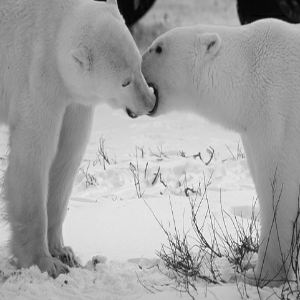

In [15]:
for batch in train_ds.take(1):
    for img in batch[0]:
        display(array_to_img(img))
    for img in batch[1]:
        display(array_to_img(img))

In [16]:
class DepthToSpace(layers.Layer):
    def __init__(self, block_size):
        super().__init__()
        self.block_size = block_size

    def call(self, input):
        batch, height, width, depth = ops.shape(input)
        depth = depth // (self.block_size**2)

        x = ops.reshape(
            input, [batch, height, width, self.block_size, self.block_size, depth]
        )
        x = ops.transpose(x, [0, 1, 3, 2, 4, 5])
        x = ops.reshape(
            x, [batch, height * self.block_size, width * self.block_size, depth]
        )
        return x


def get_model(upscale_factor=3, channels=1):
    conv_args = {
        "activation": "relu",
        "kernel_initializer": "orthogonal",
        "padding": "same",
    }
    inputs = keras.Input(shape=(None, None, channels))
    x = layers.Conv2D(64, 5, **conv_args)(inputs)
    x = layers.Conv2D(64, 3, **conv_args)(x)
    x = layers.Conv2D(32, 3, **conv_args)(x)
    x = layers.Conv2D(channels * (upscale_factor**2), 3, **conv_args)(x)
    outputs = DepthToSpace(upscale_factor)(x)

    return keras.Model(inputs, outputs)

In [17]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
import PIL


def plot_results(img, prefix, title):
    """Plot the result with zoom-in area."""
    img_array = img_to_array(img)
    img_array = img_array.astype("float32") / 255.0

    # Create a new figure with a default 111 subplot.
    fig, ax = plt.subplots()
    im = ax.imshow(img_array[::-1], origin="lower")

    plt.title(title)
    # zoom-factor: 2.0, location: upper-left
    axins = zoomed_inset_axes(ax, 2, loc=2)
    axins.imshow(img_array[::-1], origin="lower")

    # Specify the limits.
    x1, x2, y1, y2 = 200, 300, 100, 200
    # Apply the x-limits.
    axins.set_xlim(x1, x2)
    # Apply the y-limits.
    axins.set_ylim(y1, y2)

    plt.yticks(visible=False)
    plt.xticks(visible=False)

    # Make the line.
    mark_inset(ax, axins, loc1=1, loc2=3, fc="none", ec="blue")
    plt.savefig(str(prefix) + "-" + title + ".png")
    plt.show()


def get_lowres_image(img, upscale_factor):
    """Return low-resolution image to use as model input."""
    return img.resize(
        (img.size[0] // upscale_factor, img.size[1] // upscale_factor),
        PIL.Image.BICUBIC,
    )


def upscale_image(model, img):
    """Predict the result based on input image and restore the image as RGB."""
    ycbcr = img.convert("YCbCr")
    y, cb, cr = ycbcr.split()
    y = img_to_array(y)
    y = y.astype("float32") / 255.0

    input = np.expand_dims(y, axis=0)
    out = model.predict(input)

    out_img_y = out[0]
    out_img_y *= 255.0

    # Restore the image in RGB color space.
    out_img_y = out_img_y.clip(0, 255)
    out_img_y = out_img_y.reshape((np.shape(out_img_y)[0], np.shape(out_img_y)[1]))
    out_img_y = PIL.Image.fromarray(np.uint8(out_img_y), mode="L")
    out_img_cb = cb.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img_cr = cr.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img = PIL.Image.merge("YCbCr", (out_img_y, out_img_cb, out_img_cr)).convert(
        "RGB"
    )
    return out_img

In [18]:
class ESPCNCallback(keras.callbacks.Callback):
    def __init__(self):
        super().__init__()
        self.test_img = get_lowres_image(load_img(test_img_paths[0]), upscale_factor)

    # Store PSNR value in each epoch.
    def on_epoch_begin(self, epoch, logs=None):
        self.psnr = []

    def on_epoch_end(self, epoch, logs=None):
        print("Mean PSNR for epoch: %.2f" % (np.mean(self.psnr)))
        if epoch % 20 == 0:
            prediction = upscale_image(self.model, self.test_img)
            plot_results(prediction, "epoch-" + str(epoch), "prediction")

    def on_test_batch_end(self, batch, logs=None):
        self.psnr.append(10 * math.log10(1 / logs["loss"]))

In [19]:
early_stopping_callback = keras.callbacks.EarlyStopping(monitor="loss", patience=10)

checkpoint_filepath = "/tmp/checkpoint.keras"

model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=False,
    monitor="loss",
    mode="min",
    save_best_only=True,
)

model = get_model(upscale_factor=upscale_factor, channels=1)
model.summary()

callbacks = [ESPCNCallback(), early_stopping_callback, model_checkpoint_callback]
loss_fn = keras.losses.MeanSquaredError()
optimizer = keras.optimizers.Adam(learning_rate=0.001)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, None, None, 1)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, None, None, 64) │         1,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, None, None, 64) │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, None, None, 32) │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, None, None, 9)  │         2,601 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ depth_to_space (DepthToSpace)   │ (None, None, None, 1)  │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 59,657 (233.04 KB)

 Trainable params: 59,657 (233.04 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100


2025-10-26 14:12:58.039958: I external/local_xla/xla/service/service.cc:163] XLA service 0x7dce9c003ea0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-10-26 14:12:58.040061: I external/local_xla/xla/service/service.cc:171]   StreamExecutor device (0): NVIDIA GeForce RTX 2080 Ti, Compute Capability 7.5
2025-10-26 14:12:58.206684: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-10-26 14:12:58.352416: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:473] Loaded cuDNN version 90300
2025-10-26 14:12:58.883678: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-10-26 14:12:59.006277: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed ou

Mean PSNR for epoch: 22.17


2025-10-26 14:13:04.134954: W external/local_xla/xla/tsl/framework/bfc_allocator.cc:310] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.06GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2025-10-26 14:13:04.134976: W external/local_xla/xla/tsl/framework/bfc_allocator.cc:310] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.06GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2025-10-26 14:13:04.464928: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-10-26 14:13:04.645235: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has s

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 676ms/step


/tmp/ipykernel_12450/461437200.py:61: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  out_img_y = PIL.Image.fromarray(np.uint8(out_img_y), mode="L")


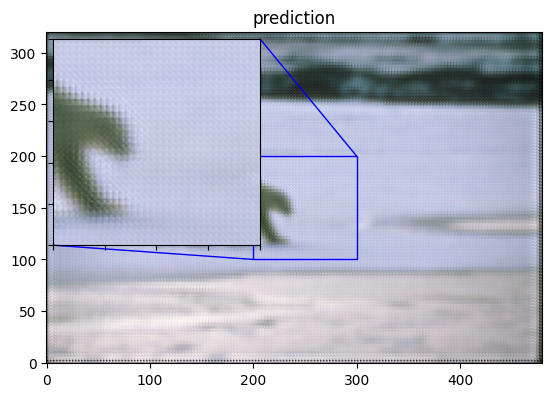

50/50 - 8s - 152ms/step - loss: 0.0263 - val_loss: 0.0062
Epoch 2/100
Mean PSNR for epoch: 24.55
50/50 - 1s - 11ms/step - loss: 0.0050 - val_loss: 0.0034
Epoch 3/100
Mean PSNR for epoch: 25.27
50/50 - 1s - 11ms/step - loss: 0.0035 - val_loss: 0.0029
Epoch 4/100
Mean PSNR for epoch: 26.04
50/50 - 1s - 11ms/step - loss: 0.0034 - val_loss: 0.0027
Epoch 5/100
Mean PSNR for epoch: 25.95
50/50 - 1s - 11ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 6/100
Mean PSNR for epoch: 26.23
50/50 - 1s - 11ms/step - loss: 0.0029 - val_loss: 0.0025
Epoch 7/100
Mean PSNR for epoch: 26.06
50/50 - 1s - 11ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 8/100
Mean PSNR for epoch: 26.09
50/50 - 1s - 11ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 9/100
Mean PSNR for epoch: 26.33
50/50 - 1s - 11ms/step - loss: 0.0028 - val_loss: 0.0025
Epoch 10/100
Mean PSNR for epoch: 26.47
50/50 - 1s - 11ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 11/100
Mean PSNR for epoch: 26.38
50/50 - 1s - 11ms/step - loss: 0.0028

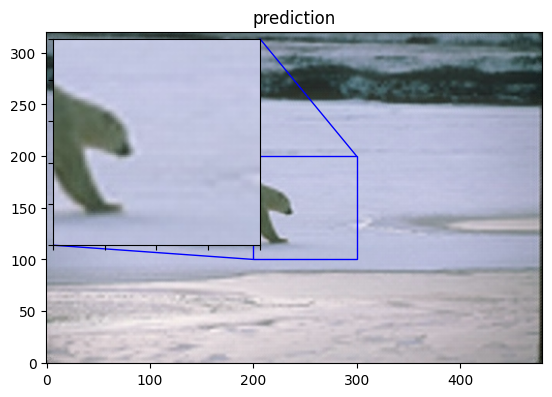

50/50 - 1s - 17ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 22/100
Mean PSNR for epoch: 26.59
50/50 - 1s - 12ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 23/100
Mean PSNR for epoch: 26.69
50/50 - 1s - 11ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 24/100
Mean PSNR for epoch: 26.48
50/50 - 1s - 11ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 25/100
Mean PSNR for epoch: 26.45
50/50 - 1s - 12ms/step - loss: 0.0028 - val_loss: 0.0024
Epoch 26/100
Mean PSNR for epoch: 26.62
50/50 - 1s - 12ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 27/100
Mean PSNR for epoch: 26.18
50/50 - 1s - 13ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 28/100
Mean PSNR for epoch: 26.28
50/50 - 1s - 12ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 29/100
Mean PSNR for epoch: 26.48
50/50 - 1s - 12ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 30/100
Mean PSNR for epoch: 26.39
50/50 - 1s - 12ms/step - loss: 0.0027 - val_loss: 0.0024
Epoch 31/100
Mean PSNR for epoch: 26.46
50/50 - 1s - 14ms/step - loss:

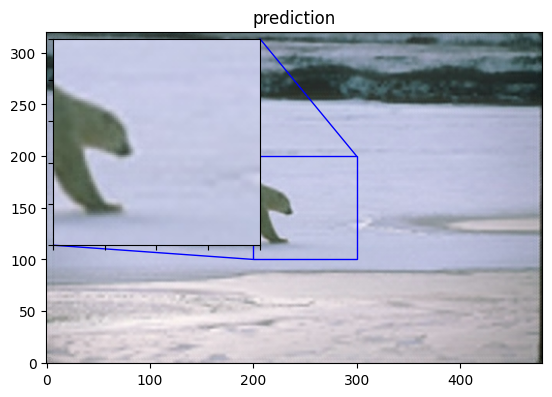

50/50 - 1s - 18ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 42/100
Mean PSNR for epoch: 26.82
50/50 - 1s - 12ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 43/100
Mean PSNR for epoch: 26.41
50/50 - 1s - 13ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 44/100
Mean PSNR for epoch: 26.46
50/50 - 1s - 14ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 45/100
Mean PSNR for epoch: 26.72
50/50 - 1s - 14ms/step - loss: 0.0025 - val_loss: 0.0023
Epoch 46/100
Mean PSNR for epoch: 26.36
50/50 - 1s - 12ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 47/100
Mean PSNR for epoch: 26.64
50/50 - 1s - 13ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 48/100
Mean PSNR for epoch: 25.88
50/50 - 1s - 13ms/step - loss: 0.0028 - val_loss: 0.0028
Epoch 49/100
Mean PSNR for epoch: 26.46
50/50 - 1s - 14ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 50/100
Mean PSNR for epoch: 26.25
50/50 - 1s - 14ms/step - loss: 0.0025 - val_loss: 0.0023
Epoch 51/100
Mean PSNR for epoch: 26.56
50/50 - 1s - 13ms/step - loss:

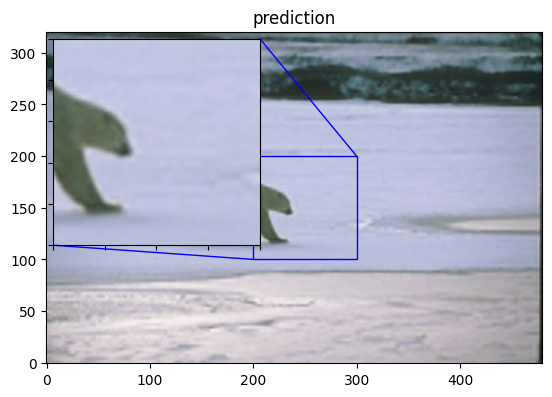

50/50 - 1s - 19ms/step - loss: 0.0026 - val_loss: 0.0023
Epoch 62/100
Mean PSNR for epoch: 26.88
50/50 - 1s - 11ms/step - loss: 0.0025 - val_loss: 0.0023
Epoch 63/100
Mean PSNR for epoch: 26.69
50/50 - 1s - 13ms/step - loss: 0.0025 - val_loss: 0.0023
Epoch 64/100
Mean PSNR for epoch: 26.38
50/50 - 1s - 14ms/step - loss: 0.0025 - val_loss: 0.0023
Epoch 65/100
Mean PSNR for epoch: 26.68
50/50 - 1s - 13ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 66/100
Mean PSNR for epoch: 26.40
50/50 - 1s - 13ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 67/100
Mean PSNR for epoch: 26.42
50/50 - 1s - 13ms/step - loss: 0.0025 - val_loss: 0.0023
Epoch 68/100
Mean PSNR for epoch: 26.34
50/50 - 1s - 14ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 69/100
Mean PSNR for epoch: 26.48
50/50 - 1s - 14ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 70/100
Mean PSNR for epoch: 26.68
50/50 - 1s - 12ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 71/100
Mean PSNR for epoch: 26.87
50/50 - 1s - 13ms/step - loss:

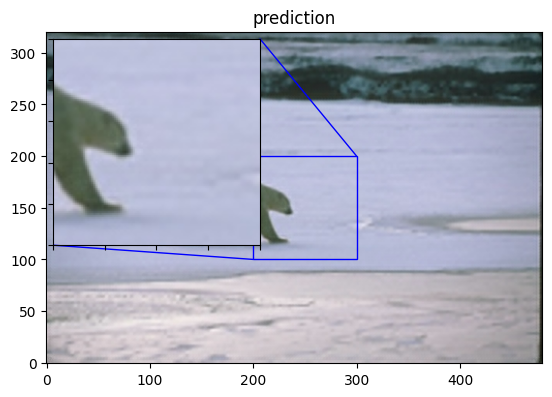

50/50 - 1s - 18ms/step - loss: 0.0026 - val_loss: 0.0024
Epoch 82/100
Mean PSNR for epoch: 26.88
50/50 - 1s - 12ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 83/100
Mean PSNR for epoch: 26.81
50/50 - 1s - 14ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 84/100
Mean PSNR for epoch: 26.62
50/50 - 1s - 12ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 85/100
Mean PSNR for epoch: 26.75
50/50 - 1s - 14ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 86/100
Mean PSNR for epoch: 26.85
50/50 - 1s - 14ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 87/100
Mean PSNR for epoch: 26.74
50/50 - 1s - 14ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 88/100
Mean PSNR for epoch: 26.86
50/50 - 1s - 14ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 89/100
Mean PSNR for epoch: 26.61
50/50 - 1s - 14ms/step - loss: 0.0025 - val_loss: 0.0022
Epoch 90/100
Mean PSNR for epoch: 26.95
50/50 - 1s - 13ms/step - loss: 0.0025 - val_loss: 0.0023
Epoch 91/100
Mean PSNR for epoch: 26.11
50/50 - 1s - 14ms/step - loss:

In [20]:
epochs = 100

model.compile(
    optimizer=optimizer,
    loss=loss_fn,
)

model.fit(
    train_ds, epochs=epochs, callbacks=callbacks, validation_data=valid_ds, verbose=2
)

# The model weights (that are considered the best) are loaded into the model.
model.load_weights(checkpoint_filepath)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


/tmp/ipykernel_12450/461437200.py:61: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  out_img_y = PIL.Image.fromarray(np.uint8(out_img_y), mode="L")


PSNR of low resolution image and high resolution image is 30.0157
PSNR of predict and high resolution is 30.6197


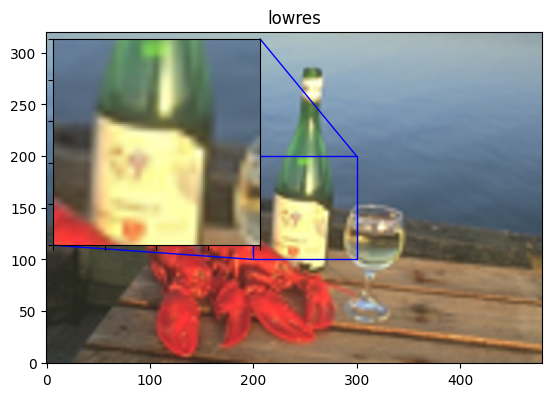

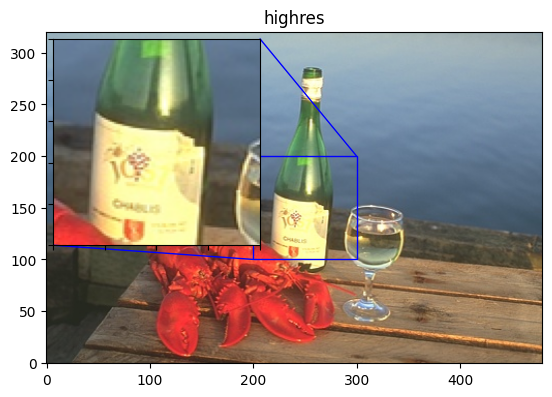

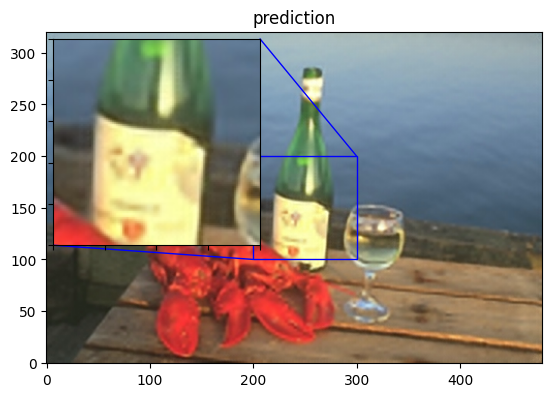

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
PSNR of low resolution image and high resolution image is 25.1103
PSNR of predict and high resolution is 26.1208


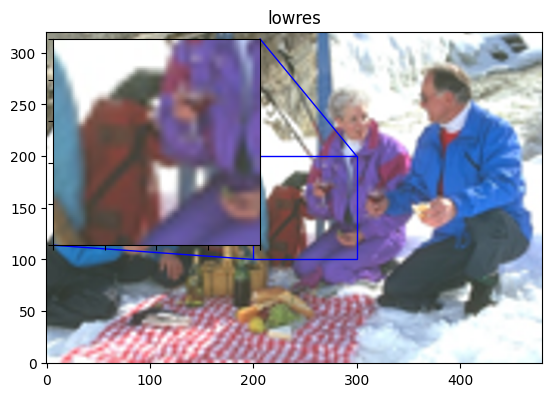

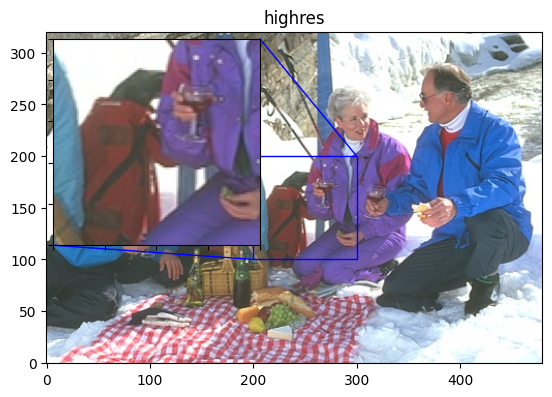

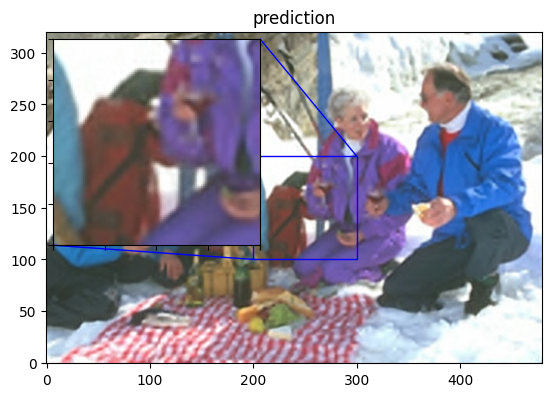

2025-10-26 14:14:10.298690: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-10-26 14:14:10.480099: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 708ms/step
PSNR of low resolution image and high resolution image is 27.7789
PSNR of predict and high resolution is 28.4674


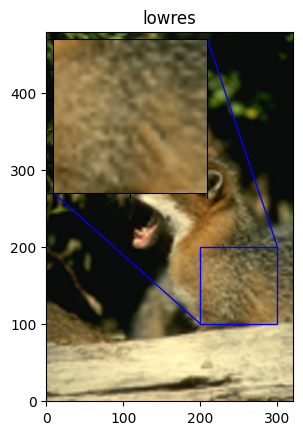

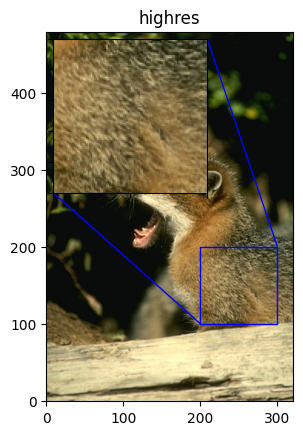

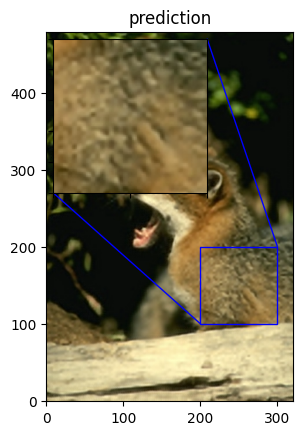

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
PSNR of low resolution image and high resolution image is 28.0321
PSNR of predict and high resolution is 28.2879


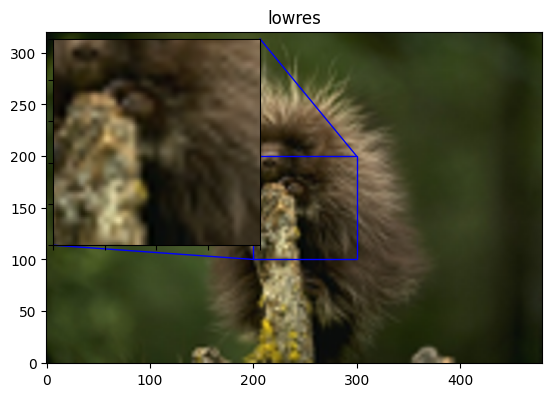

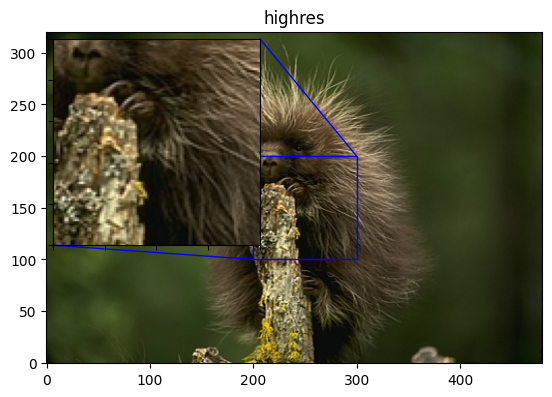

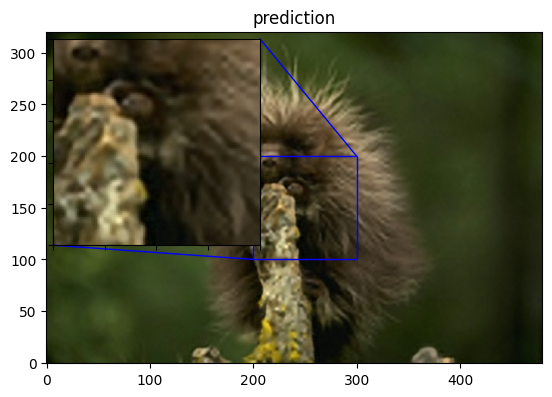

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
PSNR of low resolution image and high resolution image is 25.7853
PSNR of predict and high resolution is 26.3752


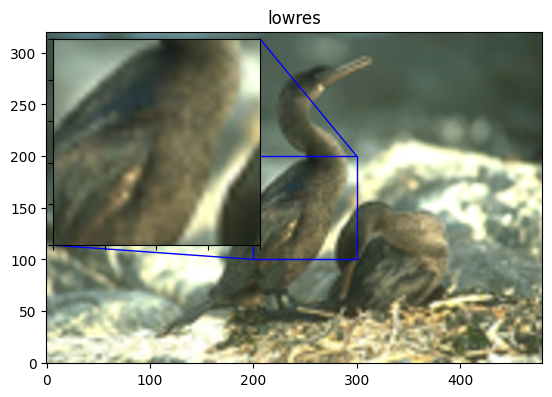

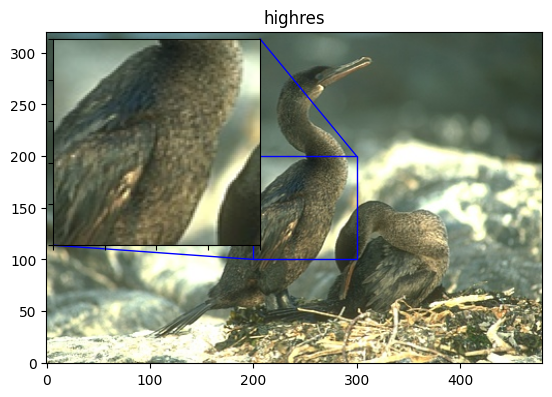

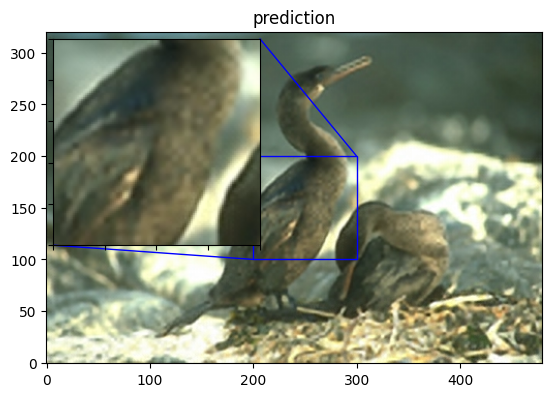

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
PSNR of low resolution image and high resolution image is 25.9181
PSNR of predict and high resolution is 26.7691


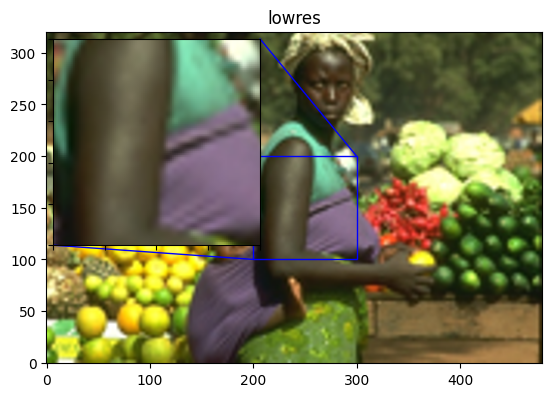

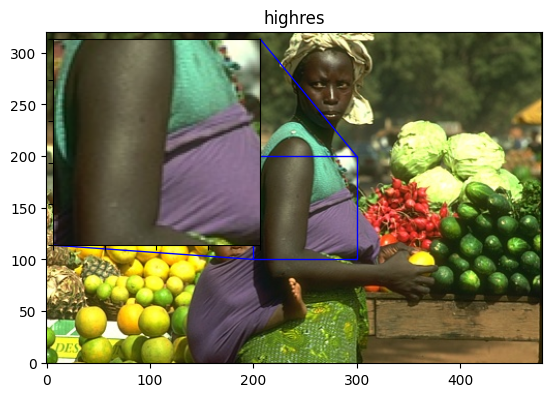

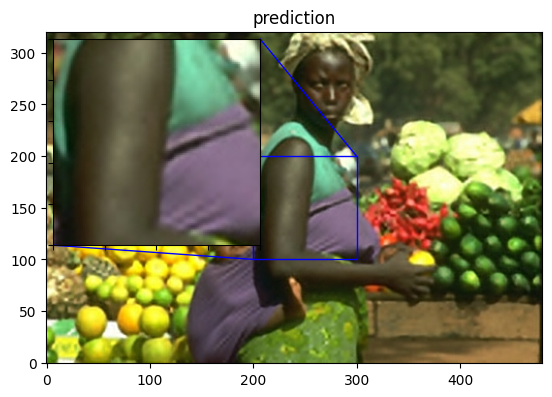

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
PSNR of low resolution image and high resolution image is 26.2389
PSNR of predict and high resolution is 27.1852


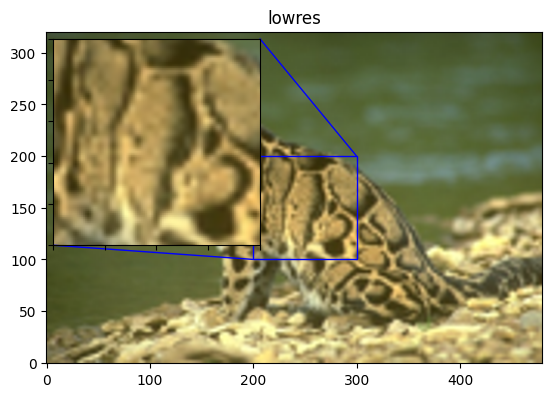

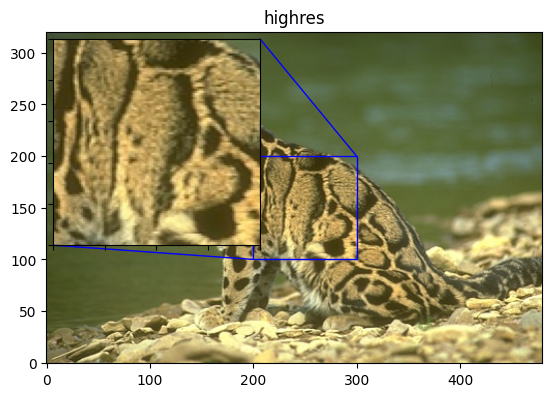

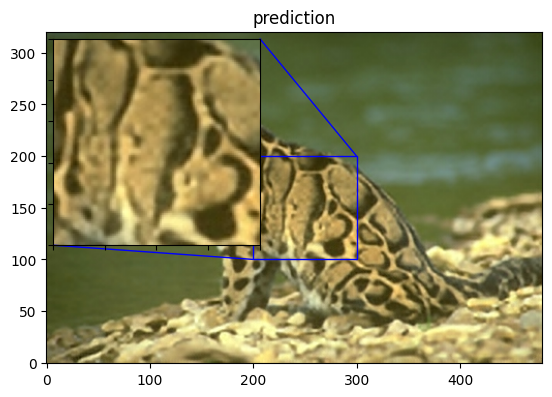

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
PSNR of low resolution image and high resolution image is 23.3281
PSNR of predict and high resolution is 24.6775


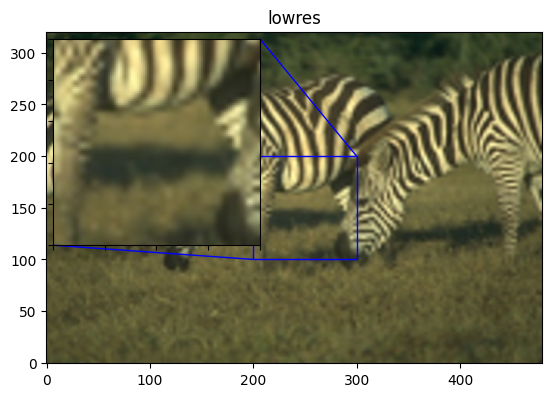

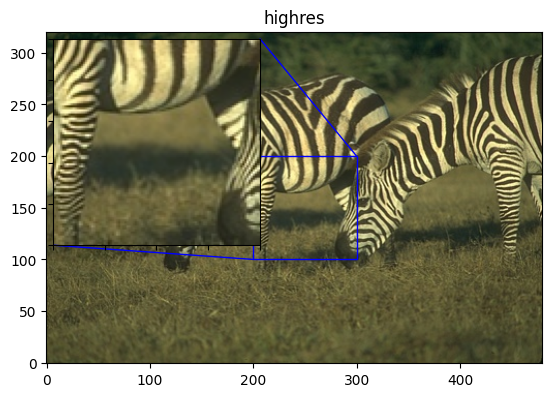

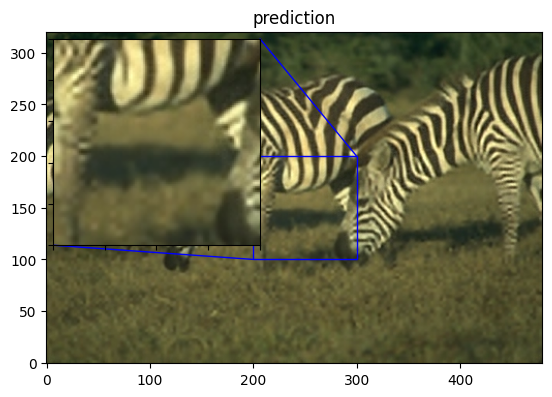

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
PSNR of low resolution image and high resolution image is 29.9008
PSNR of predict and high resolution is 30.1031


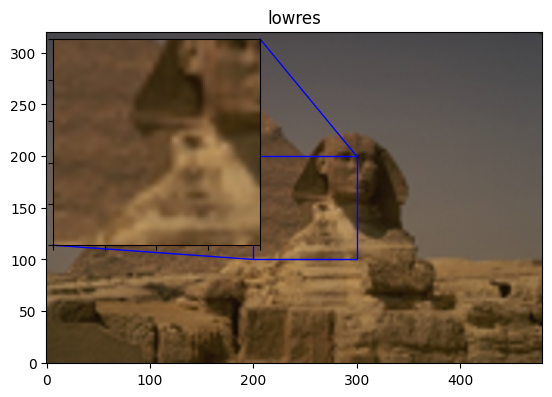

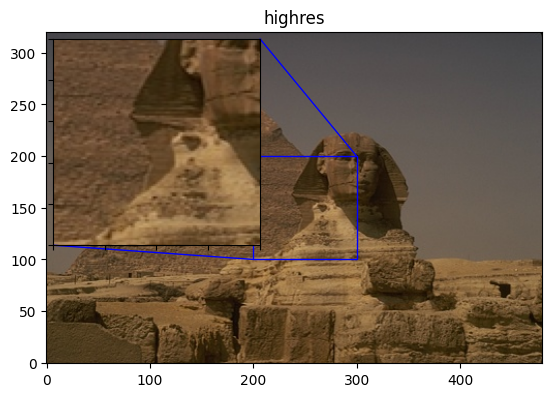

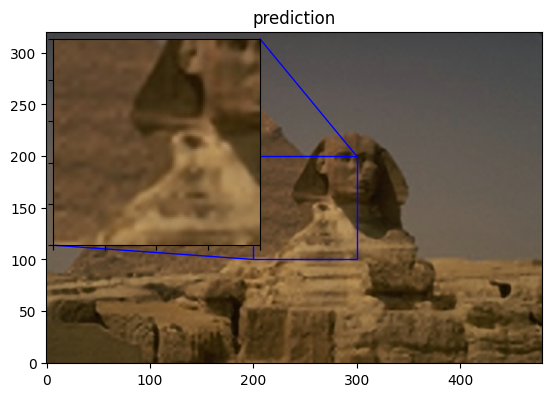

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
PSNR of low resolution image and high resolution image is 25.2492
PSNR of predict and high resolution is 25.8136


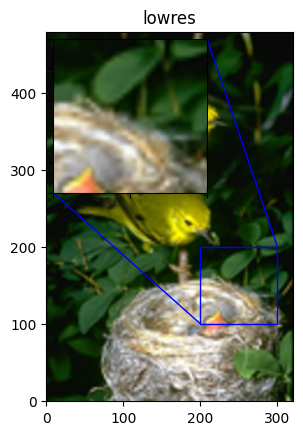

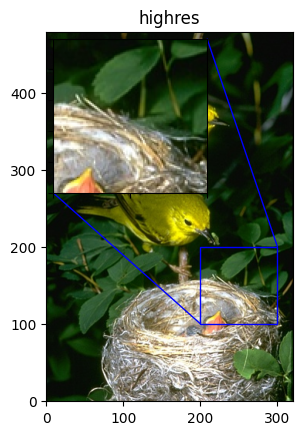

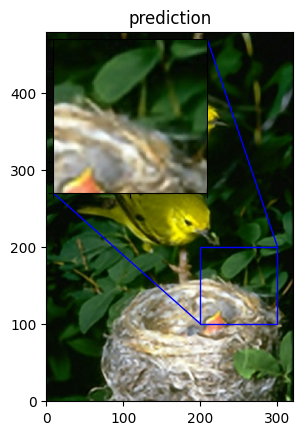

Avg. PSNR of lowres images is 26.7357
Avg. PSNR of reconstructions is 27.4419


In [21]:
total_bicubic_psnr = 0.0
total_test_psnr = 0.0

for index, test_img_path in enumerate(test_img_paths[50:60]):
    img = load_img(test_img_path)
    lowres_input = get_lowres_image(img, upscale_factor)
    w = lowres_input.size[0] * upscale_factor
    h = lowres_input.size[1] * upscale_factor
    highres_img = img.resize((w, h))
    prediction = upscale_image(model, lowres_input)
    lowres_img = lowres_input.resize((w, h))
    lowres_img_arr = img_to_array(lowres_img)
    highres_img_arr = img_to_array(highres_img)
    predict_img_arr = img_to_array(prediction)
    bicubic_psnr = tf.image.psnr(lowres_img_arr, highres_img_arr, max_val=255)
    test_psnr = tf.image.psnr(predict_img_arr, highres_img_arr, max_val=255)

    total_bicubic_psnr += bicubic_psnr
    total_test_psnr += test_psnr

    print(
        "PSNR of low resolution image and high resolution image is %.4f" % bicubic_psnr
    )
    print("PSNR of predict and high resolution is %.4f" % test_psnr)
    plot_results(lowres_img, index, "lowres")
    plot_results(highres_img, index, "highres")
    plot_results(prediction, index, "prediction")

print("Avg. PSNR of lowres images is %.4f" % (total_bicubic_psnr / 10))
print("Avg. PSNR of reconstructions is %.4f" % (total_test_psnr / 10))